<a href="https://colab.research.google.com/github/letyrodridc/Deep-Learning-Tensorflow/blob/master/6_Binary_classification_with_ImageDataGenerator_Human_vs_Hourses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Thsi notebook uses a downloaded dataset of horses and humans.

It's going to perform a binary classification.

First, downloading and unzip the data.

In [ ]:
!gdown --id 1onaG42NZft3wCE1WH0GDEbUhu75fedP5

Downloading...
From: https://drive.google.com/uc?id=1onaG42NZft3wCE1WH0GDEbUhu75fedP5
To: /content/horse-or-human.zip
100% 150M/150M [00:00<00:00, 182MB/s]


In [ ]:
import zipfile
local_zip = "./horse-or-human.zip"
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall("./horse-or-human")
zip_ref.close()

In [ ]:
local_zip = "./validation-horse-or-human.zip"
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall("./validation-horse-or-human")

zip_ref.close()

In [ ]:
import tensorflow as tf

Model creation using max poolings and convolutions.

In [ ]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(16, (3,3), activation="relu", input_shape=(300,300,3)),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(32, (3,3), activation="relu"),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(64, (3,3), activation="relu"),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(64, (3,3), activation="relu"),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Conv2D(64, (3,3), activation="relu"),
  tf.keras.layers.MaxPooling2D(2,2),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(512, activation="relu"),
  tf.keras.layers.Dense(1, activation="sigmoid")
])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 298, 298, 16)      448       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 149, 149, 16)     0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 147, 147, 32)      4640      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 73, 73, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 71, 71, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 35, 35, 64)      

It uses a Binary Crossentopy because we have two classes.

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss="binary_crossentropy", optimizer=RMSprop(learning_rate=0.001),
              metrics=['accuracy'])

To load the data uses an ImageDataGenerator. Notice that it takes a class_mode that it's binary due to our classification. It also takes a target size because it's going to resize the images. Finally, the batch_size.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
    "./horse-or-human/",
    target_size=(300, 300),
    batch_size = 128,
    class_mode = "binary"
)

validation_datagen = ImageDataGenerator(rescale=1/255)
validation_generator = validation_datagen.flow_from_directory(
    "./validation-horse-or-human/",
    target_size=(300,300),
    batch_size = 32,
    class_mode ="binary"
)

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


The fit also changes. Instead of receiving x and y, it's takign a train_generator.

In [ ]:
history = model.fit(train_generator,
                    steps_per_epoch = 8,
                    epochs = 15,
                    verbose = 1,
                    validation_data = validation_generator,
                    validation_steps=8)

Epoch 1/15
8/8 [==============================] - 87s 10s/step - loss: 0.9647 - accuracy: 0.5161 - val_loss: 0.5971 - val_accuracy: 0.8242
Epoch 2/15
8/8 [==============================] - 85s 10s/step - loss: 0.6306 - accuracy: 0.7264 - val_loss: 0.5649 - val_accuracy: 0.8164
Epoch 3/15
8/8 [==============================] - 82s 10s/step - loss: 0.6993 - accuracy: 0.7164 - val_loss: 1.5059 - val_accuracy: 0.6523
Epoch 4/15
8/8 [==============================] - 83s 10s/step - loss: 0.2609 - accuracy: 0.8877 - val_loss: 1.0660 - val_accuracy: 0.8320
Epoch 5/15
8/8 [==============================] - 83s 10s/step - loss: 0.2055 - accuracy: 0.9188 - val_loss: 0.8971 - val_accuracy: 0.8203
Epoch 6/15
8/8 [==============================] - 83s 12s/step - loss: 0.6006 - accuracy: 0.8843 - val_loss: 3.1090 - val_accuracy: 0.6289
Epoch 7/15
8/8 [==============================] - 82s 12s/step - loss: 0.1618 - accuracy: 0.9433 - val_loss: 1.3942 - val_accuracy: 0.7891
Epoch 8/15
8/8 [===========

In [ ]:
import numpy as np
from google.colab import files
from keras.preprocessing import image


uploaded = files.upload()

for fn in uploaded.keys(): 
  path = "/content/"+fn
  img = image.load_img(path, target_size=(300,300))
  x = image.img_to_array(img)
  x /= 255.0
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)

  if classes[0] > 0.5:
    print(fn + " is a human")
  else:
    print(fn + " is a horse")

Visualizing Intermediate Representations

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


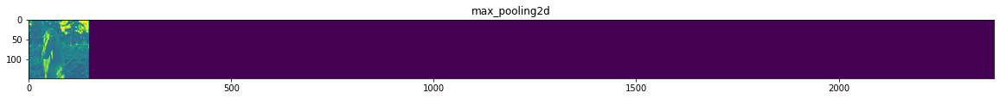

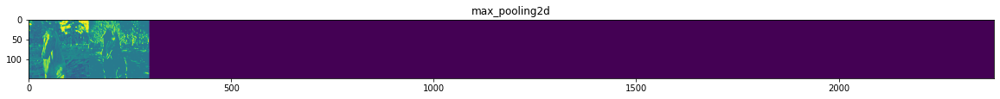

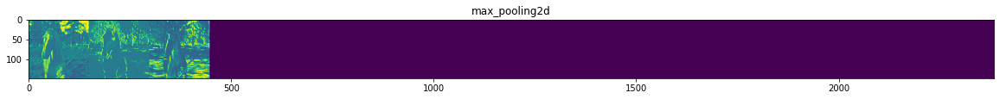

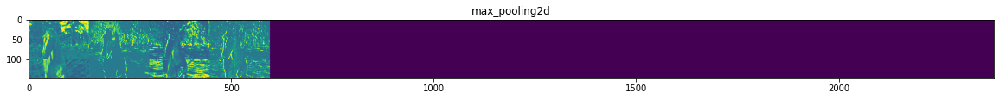

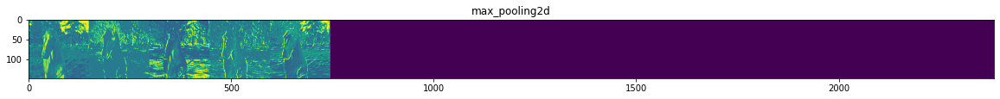

...

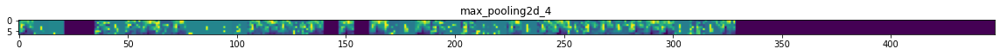

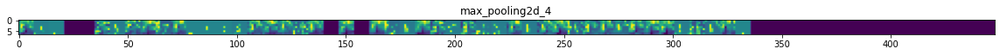

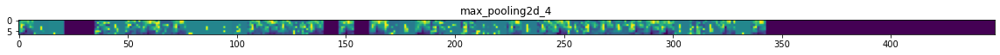

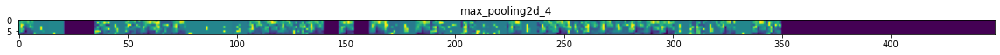

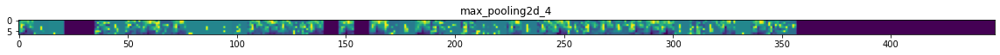

Error in callback <function flush_figures at 0x7fedb30d0e60> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import matplotlib.pyplot as plt
import os

# Directory with our training horse pictures
train_horse_dir = os.path.join('./horse-or-human/horses')
train_horse_names = os.listdir(train_horse_dir)

# Directory with our training human pictures
train_human_dir = os.path.join('./horse-or-human/humans')
train_human_names = os.listdir(train_human_dir)
horse_img_files = [os.path.join(train_horse_dir, f) for f in train_horse_names]
human_img_files = [os.path.join(train_human_dir, f) for f in train_human_names]
img_path = random.choice(horse_img_files + horse_img_files)
                         
img = load_img(img_path, target_size=(300,300))
x = img_to_array(img)
x = x.reshape((1,) + x.shape)
x /= 255

successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)
succesive_feature_maps = visualization_model.predict(x)

layers_name = [layer.name for layer in model.layers[1:]]

for layer_name, feature_map in zip(layers_name, succesive_feature_maps):
  if len(feature_map.shape) == 4:
    n_features = feature_map.shape[-1]
    size = feature_map.shape[1]

    display_grid = np.zeros((size,size*n_features))

    for i in range(n_features):
      x = feature_map[0,:,:,i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128

      x = np.clip(x, 0, 255).astype("uint8")

      display_grid[:,i*size : (i+1)*size] = x
      
      scale = 20. / n_features
      
      plt.figure(figsize=(scale * n_features, scale))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect="auto", cmap="viridis")


We can compress the images using 150x150x3 but the prediction is going to be less accurate.